Searching for images in '.'...
Found 7 images: ['Screenshot 2025-11-19 171054.png', 'Screenshot 2025-11-19 171112.png', 'Screenshot 2025-11-19 171129.png', 'Screenshot 2025-11-19 171148.png', 'Screenshot 2025-11-19 171207.png', 'Screenshot 2025-11-19 171222.png', 'Screenshot 2025-11-19 171238.png']

Success! Combined image saved to 'combined_cluster_view.png'


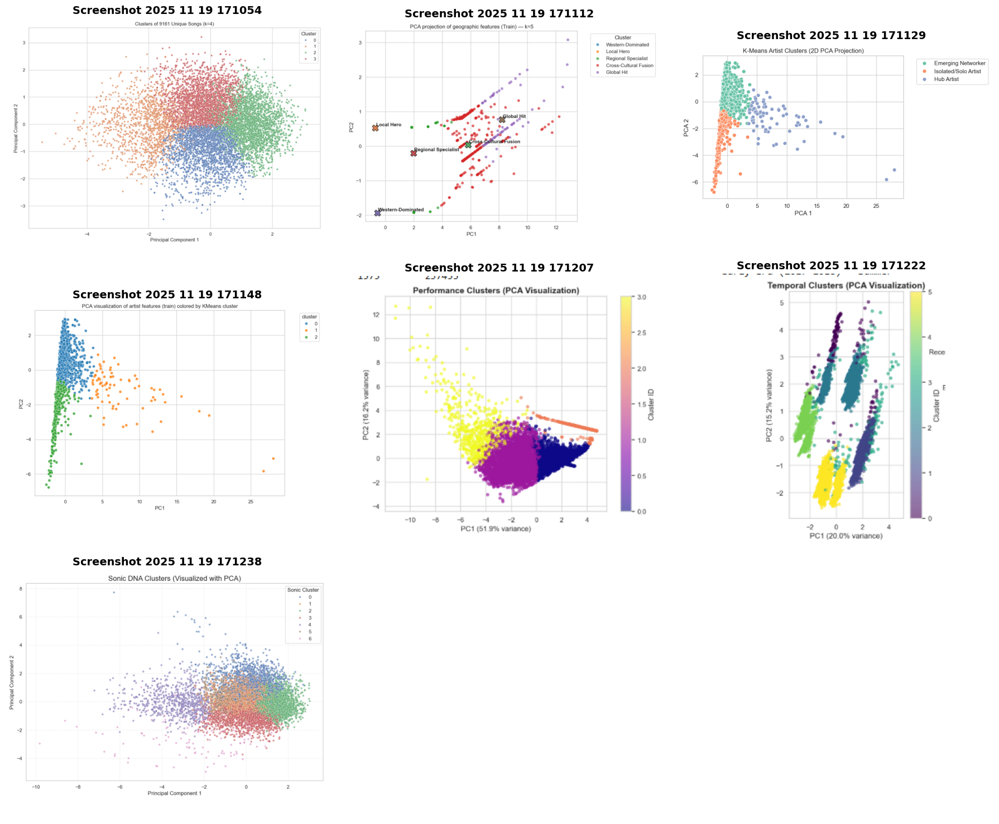

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math

# ==========================================
# CONFIGURATION
# ==========================================
# Folder containing your individual PCA images
IMAGE_FOLDER = '.'  # Current directory, or change to 'cluster_plots'
OUTPUT_FILE = 'combined_cluster_view.png'

# Optional: specific order for the images if you know the filenames
# If empty, it will load all images in the folder
# Example: IMAGE_ORDER = ['sonic.png', 'geo.png', 'temporal.png']
IMAGE_ORDER = [] 

def combine_images():
    print(f"Searching for images in '{IMAGE_FOLDER}'...")
    
    # 1. Find Images
    valid_extensions = ('.png', '.jpg', '.jpeg')
    if IMAGE_ORDER:
        # Use specific list if provided
        image_files = [f for f in IMAGE_ORDER if os.path.exists(os.path.join(IMAGE_FOLDER, f))]
    else:
        # Auto-discover
        image_files = [f for f in os.listdir(IMAGE_FOLDER) 
                       if f.lower().endswith(valid_extensions) and f != OUTPUT_FILE]
        image_files.sort() # Sort alphabetically

    if not image_files:
        print("No images found! Please check the folder path.")
        return

    print(f"Found {len(image_files)} images: {image_files}")

    # 2. Setup Grid
    n_plots = len(image_files)
    cols = 3
    rows = math.ceil(n_plots / cols)
    
    # Figure size: 6 inches wide per column, 5 inches high per row
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 5*rows))
    axes = axes.flatten()
    
    # 3. Plot Images
    for i, img_file in enumerate(image_files):
        ax = axes[i]
        img_path = os.path.join(IMAGE_FOLDER, img_file)
        
        try:
            img = mpimg.imread(img_path)
            ax.imshow(img)
            ax.axis('off') # Hide axis ticks
            
            # Clean up filename for title (remove extension and underscores)
            title = os.path.splitext(img_file)[0].replace('_', ' ').replace('-', ' ').title()
            ax.set_title(title, fontsize=14, fontweight='bold')
            
        except Exception as e:
            print(f"Error loading {img_file}: {e}")
            ax.text(0.5, 0.5, "Error Loading Image", ha='center')

    # 4. Hide Empty Subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_FILE, dpi=300, bbox_inches='tight')
    print(f"\nSuccess! Combined image saved to '{OUTPUT_FILE}'")
    plt.show()

if __name__ == "__main__":
    combine_images()


Starting PCA visualization for Sonic Clusters...
PCA components created. Now plotting...
Saved 'pca_sonic_clusters.png'


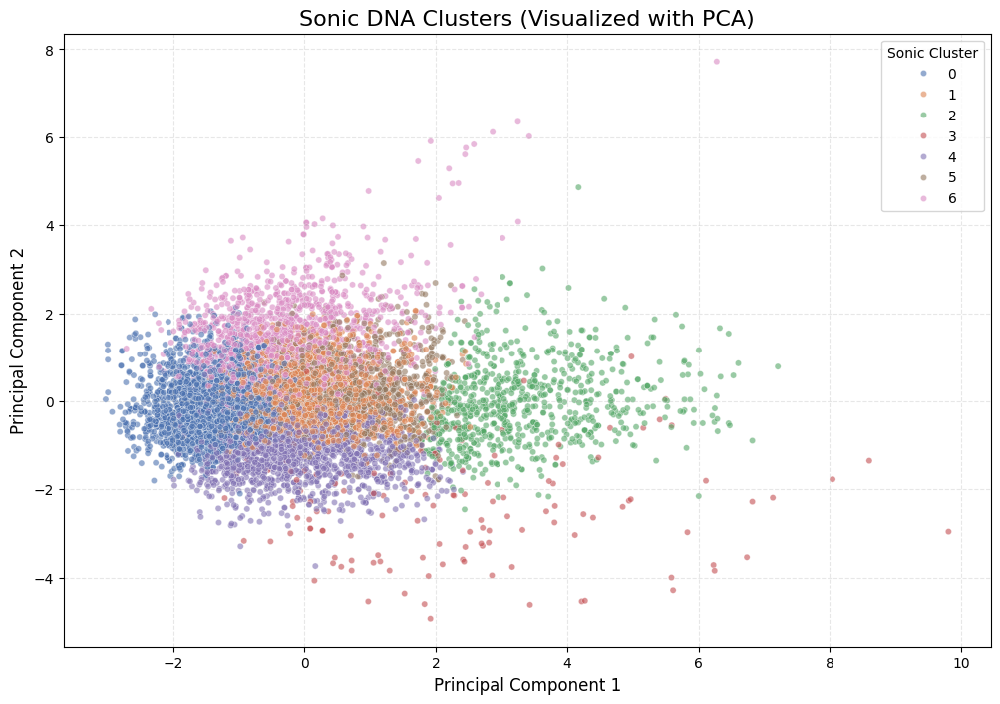

In [1]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

print("\nStarting PCA visualization for Sonic Clusters...")

# 1. Load the song table with clusters from Phase 2
try:
    song_table = pd.read_csv('song_master_table_with_clusters.csv')
except FileNotFoundError:
    print("Error: 'song_master_table_with_clusters.csv' not found.")
    print("Please ensure you have run the clustering phase first.")
    raise

# 2. Define your audio features
AUDIO_FEATURES = [
    'Danceability', 'Energy', 'Loudness', 'Speechiness', 
    'Acousticness', 'Instrumentalness', 'Valence'
]

# 3. Re-scale the audio features
# We must use the same scaling as we did for clustering
X_sonic = song_table[AUDIO_FEATURES].fillna(0)
scaler = StandardScaler()
X_sonic_scaled = scaler.fit_transform(X_sonic)

# 4. Apply PCA
# Reduce the 7 features down to 2 components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sonic_scaled)

# 5. Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['Sonic_Cluster'] = song_table['Sonic_Cluster']
# Make sure cluster is treated as a category so seaborn colors it discretely
pca_df['Sonic_Cluster'] = pca_df['Sonic_Cluster'].astype('category')

print("PCA components created. Now plotting...")

# 6. Plot the results
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Sonic_Cluster',  # Color points by their cluster
    palette='deep',       # Use a good color palette
    alpha=0.6,            # Make points slightly transparent
    s=20                  # Set size of points
)
plt.title('Sonic DNA Clusters (Visualized with PCA)', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Sonic Cluster')
plt.grid(True, linestyle='--', alpha=0.3)
plt.savefig('pca_sonic_clusters.png', bbox_inches='tight')
print("Saved 'pca_sonic_clusters.png'")

Starting Artist Success Tier Visualization...
Loaded artist_master_table_with_clusters.csv successfully.
Applying PowerTransformer...
Running PCA...
Generating Plot...
Saved plot to 'pca_artist_tiers.png'


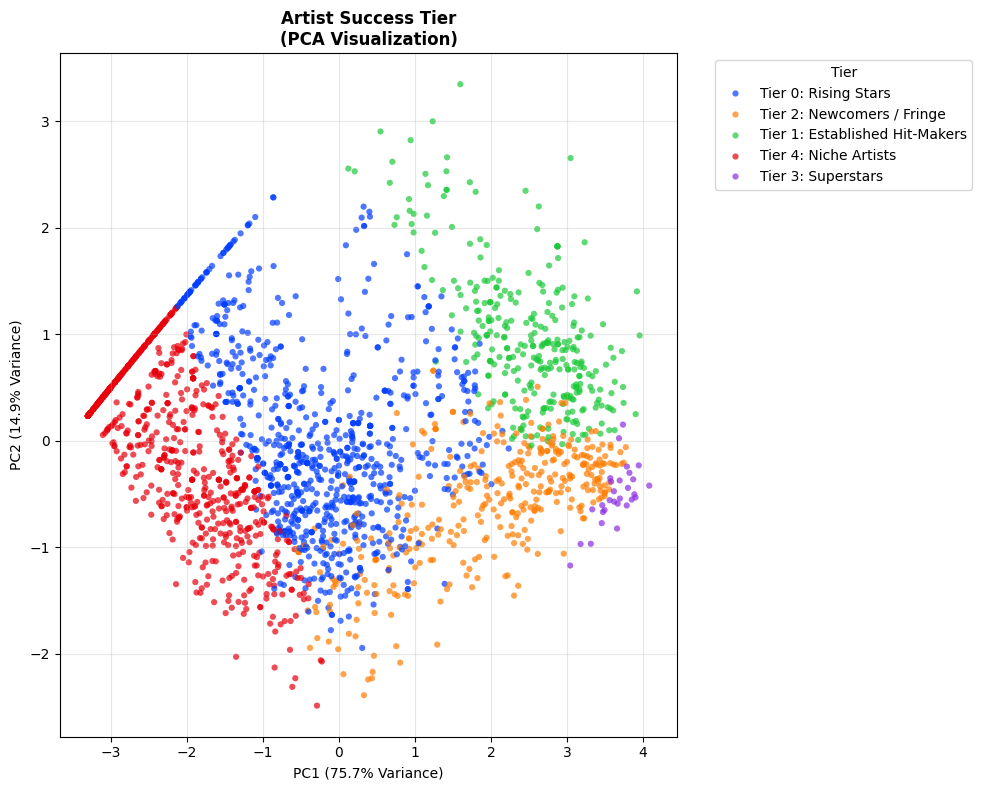

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer

print("Starting Artist Success Tier Visualization...")

# --- Configuration ---
FILE_PATH = 'artist_master_table_with_clusters.csv'
CLUSTER_COL = 'Artist_Tier'
FEATURES = [
    'total_chart_appearances', 
    'average_rank', 
    'best_rank', 
    'career_length_days', 
    'top_50_rate'
]

# !!! UPDATE THIS DICTIONARY BASED ON YOUR PROFILES CSV !!!
# Check 'artist_cluster_profiles.csv' to see which ID matches which behavior.
CLUSTER_NAMES = {
    0: "Tier 0: Rising Stars",
    1: "Tier 1: Established Hit-Makers",
    2: "Tier 2: Newcomers / Fringe",
    3: "Tier 3: Superstars",
    4: "Tier 4: Niche Artists"
}

# 1. Load Data
try:
    df = pd.read_csv(FILE_PATH)
    print(f"Loaded {FILE_PATH} successfully.")
except FileNotFoundError:
    print(f"Error: '{FILE_PATH}' not found.")
    print("Please ensure the artist clustering phase was completed successfully.")
    raise

# 2. Preprocessing
# Remove rows with missing values in the relevant columns
df_clean = df.dropna(subset=FEATURES + [CLUSTER_COL]).copy()

# Map the numerical cluster IDs to names
# If a cluster ID isn't in the dictionary, it keeps the number
df_clean['Cluster_Name'] = df_clean[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df_clean[CLUSTER_COL])

# Use PowerTransformer (Yeo-Johnson) as per your optimized script
# This helps separate the clusters better than standard scaling for skewed data
print("Applying PowerTransformer...")
pt = PowerTransformer(method='yeo-johnson')
X_scaled = pt.fit_transform(df_clean[FEATURES])

# 3. Apply PCA
print("Running PCA...")
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Add PCA coordinates back to dataframe for plotting
df_clean['PC1'] = X_pca[:, 0]
df_clean['PC2'] = X_pca[:, 1]

# 4. Plot
print("Generating Plot...")
plt.figure(figsize=(10, 8))

# Ensure cluster column is categorical for proper coloring
df_clean['Cluster_Name'] = df_clean['Cluster_Name'].astype(str)

sns.scatterplot(
    data=df_clean,
    x='PC1', 
    y='PC2', 
    hue='Cluster_Name', # Use the new named column
    palette='bright', 
    s=20, 
    alpha=0.7, 
    linewidth=0
)

# Add variance explained info
var_expl = pca.explained_variance_ratio_
plt.xlabel(f"PC1 ({var_expl[0]:.1%} Variance)")
plt.ylabel(f"PC2 ({var_expl[1]:.1%} Variance)")
plt.title('Artist Success Tier\n(PCA Visualization)', fontweight='bold')
plt.legend(title='Tier', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

# Save
output_filename = 'pca_artist_tiers.png'
plt.tight_layout()
plt.savefig(output_filename, dpi=300, bbox_inches='tight')
print(f"Saved plot to '{output_filename}'")


--- Processing Temporal Clusters ---
Loaded temporal_features_with_clusters.csv
Saved plot to 'pca_temporal_clusters.png'

--- Processing Performance Clusters ---
Loaded performance_features_with_clusters.csv
Saved plot to 'pca_performance_clusters.png'


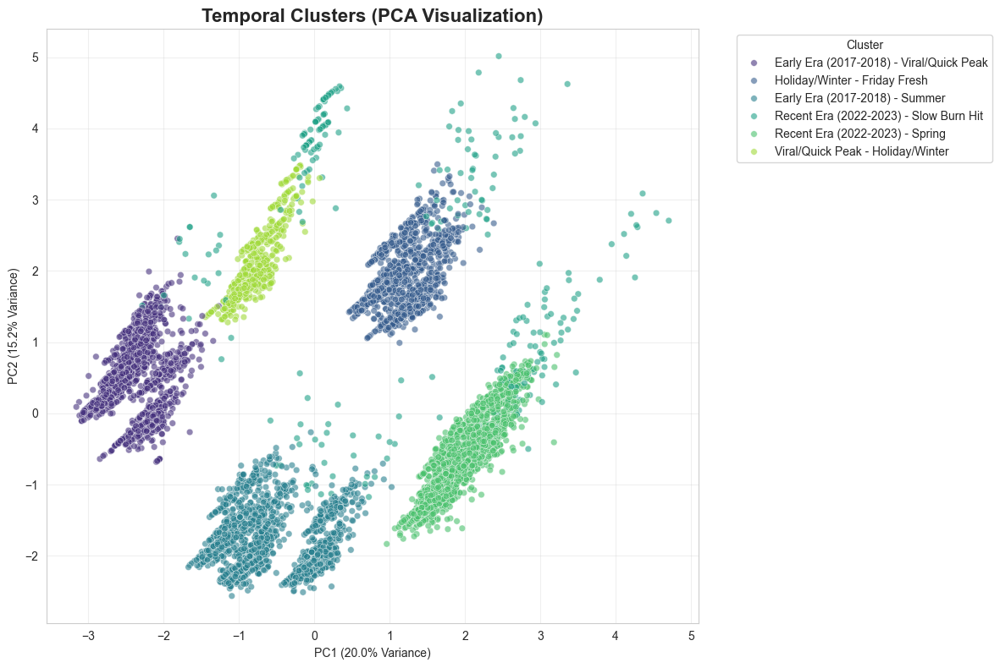

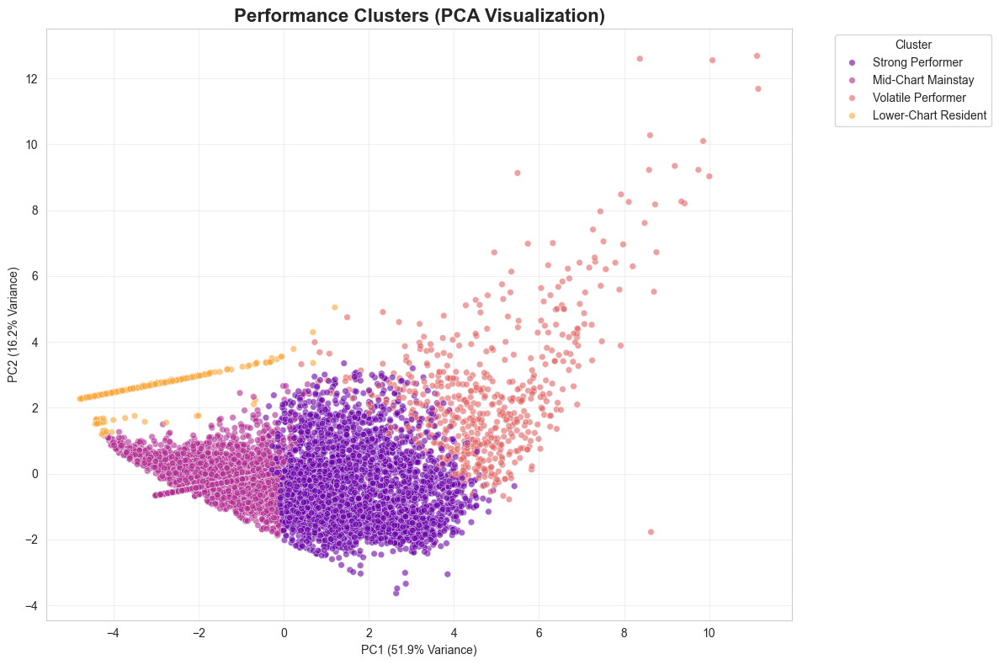

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

def plot_pca(file_path, features, cluster_col, title, output_file):
    print(f"\n--- Processing {title} ---")
    
    # 1. Load Data
    try:
        df = pd.read_csv(file_path)
        print(f"Loaded {file_path}")
    except FileNotFoundError:
        print(f"Error: '{file_path}' not found.")
        return

    # 2. Prepare Features
    # Filter to only the features used for clustering
    X = df[features].copy()
    
    # Handle missing/infinite values (mimicking original script logic)
    X = X.replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.median())
    
    # 3. Scale Data (Using StandardScaler as per original script)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # 4. Apply PCA
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    
    # Add PCA coords back to dataframe for plotting
    df['PC1'] = X_pca[:, 0]
    df['PC2'] = X_pca[:, 1]
    
    # 5. Plotting
    plt.figure(figsize=(12, 8))
    
    # Determine hue column (use Name if available, else ID)
    hue_col = f"{cluster_col}_Name" if f"{cluster_col}_Name" in df.columns else cluster_col
    
    # Convert to string to ensure categorical coloring
    df[hue_col] = df[hue_col].astype(str)
    
    sns.scatterplot(
        data=df,
        x='PC1', 
        y='PC2', 
        hue=hue_col,
        palette='viridis' if 'Temporal' in title else 'plasma',
        alpha=0.6, 
        s=30
    )
    
    # Labels and Titles
    var_expl = pca.explained_variance_ratio_
    plt.xlabel(f"PC1 ({var_expl[0]:.1%} Variance)")
    plt.ylabel(f"PC2 ({var_expl[1]:.1%} Variance)")
    plt.title(f'{title} (PCA Visualization)', fontsize=16, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cluster')
    plt.grid(True, alpha=0.3)
    
    # Save
    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Saved plot to '{output_file}'")

# ==========================================
# 1. TEMPORAL CLUSTERS PCA
# ==========================================
temporal_features_list = [
    'Year',
    'Month_Sin', 'Month_Cos',
    'DayOfWeek_Sin', 'DayOfWeek_Cos',
    'IsWeekend',
    'Quarter',
    'Chart_Weeks',
    'Days_In_Charts',
    'Weeks_Per_Day_Ratio',
    'Quick_Peak_Score',
    'Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter'
]

plot_pca(
    file_path='temporal_features_with_clusters.csv',
    features=temporal_features_list,
    cluster_col='Temporal_Cluster',
    title='Temporal Clusters',
    output_file='pca_temporal_clusters.png'
)

# ==========================================
# 2. PERFORMANCE CLUSTERS PCA
# ==========================================
performance_features_list = [
    'Best_Rank',
    'Avg_Rank',
    'Rank_Std',
    'Chart_Weeks',
    'Total_Points',
    'Points_Per_Week',
    'Top10_Rate',
    'Top50_Rate',
    'Rank_Range',
    'Volatility_Score',
    'Dominance_Score',
    'Consistency_Score',
    'Rank_Trajectory'
]

plot_pca(
    file_path='performance_features_with_clusters.csv',
    features=performance_features_list,
    cluster_col='Performance_Cluster',
    title='Performance Clusters',
    output_file='pca_performance_clusters.png'
)

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

def plot_collab_pca():
    print("Starting Collaboration PCA Visualization...")
    print(f"Current working directory: {os.getcwd()}")

    # 1. Define possible locations for the file
    # We check the current folder first, then the default output folder from the generation script
    possible_paths = [
        "artist_features_train_with_clusters.csv",                                      # Option A: Same folder
        os.path.join("collab_clustering_outputs", "artist_features_train_with_clusters.csv"), # Option B: Output subfolder
        os.path.join("..", "artist_features_train_with_clusters.csv")                     # Option C: One folder up
    ]

    file_path = None
    for path in possible_paths:
        if os.path.exists(path):
            file_path = path
            print(f"Success: Found file at '{file_path}'")
            break
    
    # 2. Handle missing file
    if file_path is None:
        print("\n!!! ERROR: File not found !!!")
        print("Checked the following locations:")
        for p in possible_paths:
            print(f" - {os.path.abspath(p)}")
        print("\nPlease locate 'artist_features_train_with_clusters.csv' and move it to one of these folders.")
        return

    # 3. Load the Data
    try:
        df = pd.read_csv(file_path)
        print(f"Loaded {len(df)} artists.")
    except Exception as e:
        print(f"Error reading file: {e}")
        return

    # 4. Validate Columns
    required_cols = ['pca1', 'pca2', 'cluster_label']
    missing = [c for c in required_cols if c not in df.columns]
    if missing:
        print(f"Error: The file is missing required columns: {missing}")
        print(f"Available columns are: {df.columns.tolist()}")
        return

    # 5. Plotting
    plt.figure(figsize=(10, 7))
    
    sns.scatterplot(
        data=df, 
        x='pca1', 
        y='pca2', 
        hue='cluster_label', 
        palette='Set2', 
        s=50,
        alpha=0.8
    )

    plt.title("K-Means Artist Clusters (2D PCA Projection)", fontsize=14, fontweight='bold')
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    
    # Move legend outside for clarity
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Collaborator Type')
    
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    # Save
    output_file = "pca_collaboration_clusters.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Saved plot to '{output_file}'")

if __name__ == "__main__":
    plot_collab_pca()

Starting Collaboration PCA Visualization...
Current working directory: C:\Users\patil\Downloads\spotify_data\IMG

!!! ERROR: File not found !!!
Checked the following locations:
 - C:\Users\patil\Downloads\spotify_data\IMG\artist_features_train_with_clusters.csv
 - C:\Users\patil\Downloads\spotify_data\IMG\collab_clustering_outputs\artist_features_train_with_clusters.csv
 - C:\Users\patil\Downloads\spotify_data\artist_features_train_with_clusters.csv

Please locate 'artist_features_train_with_clusters.csv' and move it to one of these folders.


Starting Geographic Reach PCA Visualization...
Success: Found file at 'songs_train_with_clusters.csv'
Loaded 9161 songs.
Calculating PCA coordinates...
Saved plot to 'pca_geographic_clusters.png'


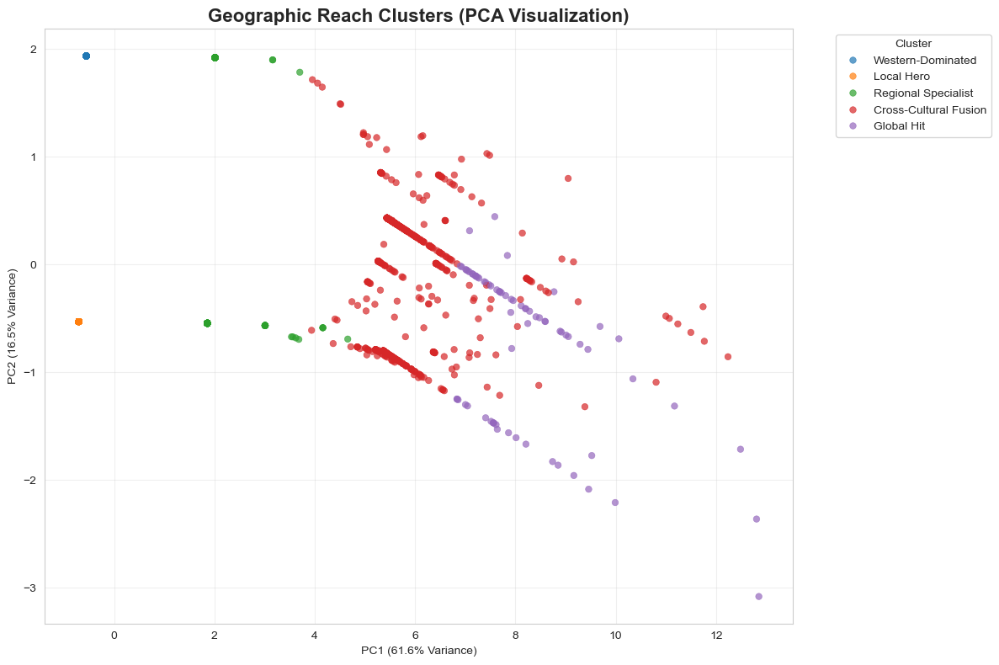

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os

def plot_geo_pca():
    print("Starting Geographic Reach PCA Visualization...")
    
    # 1. Define possible locations for the file
    # Checks current folder, 'geo_clustering_outputs', and parent folder
    possible_paths = [
        "songs_train_with_clusters.csv",
        os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
        os.path.join("..", "songs_train_with_clusters.csv")
    ]

    file_path = None
    for path in possible_paths:
        if os.path.exists(path):
            file_path = path
            print(f"Success: Found file at '{file_path}'")
            break
    
    if file_path is None:
        print("\n!!! ERROR: File not found !!!")
        print("Please ensure 'songs_train_with_clusters.csv' exists.")
        return

    # 2. Load Data
    try:
        df = pd.read_csv(file_path)
        print(f"Loaded {len(df)} songs.")
    except Exception as e:
        print(f"Error reading file: {e}")
        return

    # 3. Prepare Features for PCA
    # We must re-run PCA here because the coordinates aren't usually saved in the CSV
    geo_features = [
        "num_nationalities",
        "num_continents",
        "international_collab",
        "geographic_diversity_score",
        "points_from_international",
        "western_dominance"
    ]

    # Verify columns exist
    missing = [c for c in geo_features if c not in df.columns]
    if missing:
        print(f"Error: Missing columns {missing}")
        return

    # 4. Scale and Transform
    print("Calculating PCA coordinates...")
    X = df[geo_features].fillna(0).values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    df['PC1'] = X_pca[:, 0]
    df['PC2'] = X_pca[:, 1]

    # 5. Plotting
    plt.figure(figsize=(12, 8))
    
    # Determine hue (Label preferred, fallback to Cluster ID)
    hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
    
    # Set palette based on number of clusters
    n_clusters = df[hue_col].nunique()
    palette = sns.color_palette("tab10", n_colors=n_clusters)

    sns.scatterplot(
        data=df,
        x='PC1', 
        y='PC2', 
        hue=hue_col, 
        palette=palette, 
        s=30, 
        alpha=0.7,
        edgecolor=None
    )

    # Formatting
    var_expl = pca.explained_variance_ratio_
    plt.title(f"Geographic Reach Clusters (PCA Visualization)", fontsize=16, fontweight='bold')
    plt.xlabel(f"PC1 ({var_expl[0]:.1%} Variance)")
    plt.ylabel(f"PC2 ({var_expl[1]:.1%} Variance)")
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Cluster")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Save
    output_file = "pca_geographic_clusters.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Saved plot to '{output_file}'")

if __name__ == "__main__":
    plot_geo_pca()

Starting Audio Evolution PCA Visualization...
Success: Found file at 'Audio_evolution_clustering.csv'
Loaded 651936 chart entries.
Recalculating audio deviation features...
Aggregated to 9161 unique songs.
Saved plot to 'unique_songs_cluster_plot.png'


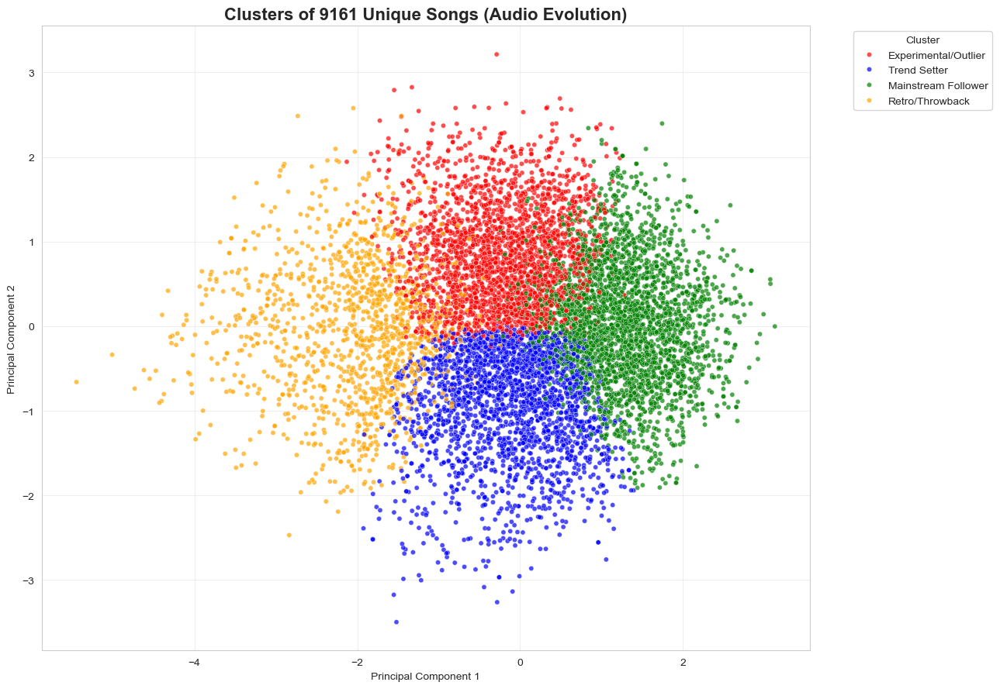

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

def plot_evolution_pca():
    print("Starting Audio Evolution PCA Visualization...")

    # 1. Define possible locations for the file
    possible_paths = [
        "Audio_evolution_clustering.csv",
        os.path.join("..", "Audio_evolution_clustering.csv"),
        os.path.join("data", "Audio_evolution_clustering.csv")
    ]

    file_path = None
    for path in possible_paths:
        if os.path.exists(path):
            file_path = path
            print(f"Success: Found file at '{file_path}'")
            break
    
    if file_path is None:
        print("\n!!! ERROR: File not found !!!")
        print("Please ensure 'Audio_evolution_clustering.csv' exists.")
        print("(You need to run the main clustering analysis script first to generate this file.)")
        return

    # 2. Load Data
    try:
        df = pd.read_csv(file_path)
        print(f"Loaded {len(df)} chart entries.")
    except Exception as e:
        print(f"Error reading file: {e}")
        return

    # 3. Re-Engineer Features for PCA
    # The PCA was based on "Deviation from Year Average" for specific features.
    # These intermediate numbers usually aren't saved, so we recalculate them here.
    
    print("Recalculating audio deviation features...")
    
    # Ensure date format
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
    else:
        print("Error: 'Date' column missing.")
        return

    # Features defined in the analysis (Line 19 of your snippet)
    audio_features = ['Danceability', 'Energy', 'Valence']
    
    # Check if columns exist
    if not all(col in df.columns for col in audio_features):
        print(f"Error: Missing one of {audio_features} in dataset.")
        return

    # Calculate Year Averages
    year_avg_features = df.groupby('Year')[audio_features].transform('mean')
    
    # Calculate Deviations
    df_dev = df[audio_features].sub(year_avg_features)
    df_dev.columns = [f'{col}_dev' for col in audio_features]
    
    # Combine with ID and Cluster info
    # We check for the named cluster column first, then fallback to ID
    cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
    
    df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)

    # 4. Aggregate to Unique Songs
    # We group by ID, taking the MEAN of the deviation features, and the FIRST of the cluster labels
    agg_dict = {col: 'mean' for col in df_dev.columns}
    agg_dict[cluster_col] = 'first'
    
    df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
    print(f"Aggregated to {len(df_unique)} unique songs.")

    # 5. Scale and PCA
    scaler = StandardScaler()
    X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    df_unique['PCA 1'] = X_pca[:, 0]
    df_unique['PCA 2'] = X_pca[:, 1]

    # 6. Plotting
    plt.figure(figsize=(13, 9))
    
    # Define color map if using the specific named clusters
    palette = 'deep'
    if cluster_col == 'evolution_cluster_name':
        # Matching the specific colors from your snippet
        color_map = {
            "Mainstream Follower": "green",
            "Trend Setter": "blue",
            "Experimental/Outlier": "red",
            "Retro/Throwback": "orange"
        }
        # Only use this map if the values actually match
        if set(df_unique[cluster_col].unique()).issubset(color_map.keys()):
            palette = color_map

    sns.scatterplot(
        data=df_unique,
        x='PCA 1',
        y='PCA 2',
        hue=cluster_col,
        palette=palette,
        alpha=0.7,
        s=20
    )

    plt.title(f'Clusters of {len(df_unique)} Unique Songs (Audio Evolution)', fontsize=16, fontweight='bold')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    # Save
    output_file = "unique_songs_cluster_plot.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Saved plot to '{output_file}'")

if __name__ == "__main__":
    plot_evolution_pca()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# --- Configuration ---
# The list of 7 expected output files (Updated filenames as requested)
IMAGE_FILES = [
    "pca_sonic_clusters.png",           # Phase 2 (Sonic)
    "pca_artist_tiers.png",             # Phase 3 (Artist)
    "pca_temporal_clusters.png",        # Temporal
    "pca_performance_clusters.png",     # Performance
    "Collab.jpg",                       # Collaboration (Updated)
    "pca_geographic_clusters.jpg",      # Geographic (Updated)
    "unique_songs_cluster_plot.png"     # Audio Evolution
]

# Updated output format to SVG
OUTPUT_FILENAME = "final_analysis_dashboard.svg"

def stitch_images():
    print("Stitching images together into SVG dashboard...")

    # Setup a 2x4 grid (8 slots for 7 images)
    # 'constrained_layout' auto-adjusts spacing to prevent overlapping and reduces whitespace
    rows = 2
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(28, 14), constrained_layout=True)
    
    # Add a main title to the entire figure
    fig.suptitle('Comprehensive Music Analysis Dashboard', fontsize=28, fontweight='bold', y=1.02)
    
    # Set background to pure white (looks better in SVG)
    fig.patch.set_facecolor('white')
    
    axes = axes.flatten() # Flatten 2D grid to 1D list for easy iteration

    # Loop through the file list and place images
    for i, filename in enumerate(IMAGE_FILES):
        ax = axes[i]
        
        # Check locations (current folder, parent, or specific subfolders)
        possible_paths = [
            filename,
            os.path.join("collab_clustering_outputs", filename),
            os.path.join("geo_clustering_outputs", filename),
            os.path.join("..", filename)
        ]
        
        found_path = None
        for path in possible_paths:
            if os.path.exists(path):
                found_path = path
                break
        
        if found_path:
            try:
                img = mpimg.imread(found_path)
                ax.imshow(img)
                
                # Clean Title for each subplot
                clean_title = filename.replace("pca_", "").replace("_", " ").replace(".png", "").replace(".jpg", "").title()
                ax.set_title(clean_title, fontsize=14, fontweight='bold', pad=10)
                
                print(f"  [x] Added {filename}")
            except Exception as e:
                ax.text(0.5, 0.5, f"Error loading\n{filename}", 
                        ha='center', va='center', color='red')
                print(f"  [!] Error reading {filename}: {e}")
        else:
            # Display placeholder text if file missing
            ax.text(0.5, 0.5, f"File Not Found:\n{filename}", 
                    ha='center', va='center', color='gray', fontsize=10)
            print(f"  [ ] Missing {filename}")
        
        # Turn off the axis (lines, ticks, labels) completely
        ax.set_axis_off()

    # Hide any remaining empty slots
    if len(IMAGE_FILES) < len(axes):
        for j in range(len(IMAGE_FILES), len(axes)):
            axes[j].set_axis_off()

    # Save as SVG
    # dpi=300 ensures the embedded raster images (PNG/JPG) remain high quality
    plt.savefig(OUTPUT_FILENAME, format='svg', dpi=300, bbox_inches='tight')
    print(f"\nSuccess! Enhanced dashboard saved to '{OUTPUT_FILENAME}'")
    plt.show()

if __name__ == "__main__":
    stitch_images()

Stitching images together into SVG dashboard...
  [x] Added pca_sonic_clusters.png
  [x] Added pca_artist_tiers.png
  [x] Added pca_temporal_clusters.png
  [x] Added pca_performance_clusters.png
  [x] Added Collab.jpg
  [x] Added pca_geographic_clusters.jpg
  [x] Added unique_songs_cluster_plot.png


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

from sklearn.preprocessing import StandardScaler, PowerTransformer
import networkx as nx
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")

def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

# --- Subplot generator functions ---

def plot_pca_sonic_clusters(ax):
    AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
    df = pd.read_csv('song_master_table_with_clusters.csv')
    X = df[AUDIO_FEATURES].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
    pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
    sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette='deep', alpha=0.6, s=20)
    ax.set_title('Sonic DNA Clusters (PCA)', fontsize=20)
    ax.set_xlabel('Principal Component 1', fontsize=16)
    ax.set_ylabel('Principal Component 2', fontsize=16)
    ax.legend(fontsize=12, title='Sonic Cluster')
    ax.grid(True, linestyle='--', alpha=0.3)

def plot_pca_artist_tiers(ax):
    FILE_PATH = 'artist_master_table_with_clusters.csv'
    CLUSTER_COL = 'Artist_Tier'
    FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
    CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
    df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
    df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
    pt = PowerTransformer()
    X_scaled = pt.fit_transform(df[FEATURES])
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
    sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette='bright', s=20, alpha=0.7)
    var_expl = pca.explained_variance_ratio_
    ax.set_xlabel(f"PC1 ({var_expl[0]:.1%} Variance)", fontsize=16)
    ax.set_ylabel(f"PC2 ({var_expl[1]:.1%} Var.)", fontsize=16)
    ax.set_title('Artist Success Tier (PCA)', fontsize=20, fontweight='bold')
    ax.legend(title='Tier', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)

def plot_pca_temporal_clusters(ax):
    FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
    df = pd.read_csv('temporal_features_with_clusters.csv')
    X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
    sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette='viridis', alpha=0.6, s=30)
    var_expl = pca.explained_variance_ratio_
    ax.set_xlabel(f"PC1 ({var_expl[0]:.1%} Variance)", fontsize=16)
    ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
    ax.set_title('Temporal Clusters (PCA)', fontsize=20, fontweight='bold')
    ax.legend(fontsize=12, title='Cluster', bbox_to_anchor=(1.05, 1))
    ax.grid(True, alpha=0.3)

def plot_pca_performance_clusters(ax):
    FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
    df = pd.read_csv('performance_features_with_clusters.csv')
    X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
    sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette='plasma', alpha=0.6, s=30)
    var_expl = pca.explained_variance_ratio_
    ax.set_xlabel(f"PC1 ({var_expl[0]:.1%})", fontsize=16)
    ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
    ax.set_title('Performance Clusters (PCA)', fontsize=20, fontweight='bold')
    ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), title='Cluster')
    ax.grid(True, alpha=0.3)

def plot_pca_geographic_clusters(ax):
    geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
    paths = [
        "songs_train_with_clusters.csv",
        os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
        os.path.join("..", "songs_train_with_clusters.csv")
    ]
    df = load_csv_first(paths)
    X = df[geo_features].fillna(0)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
    hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
    n_clusters = df[hue_col].nunique()
    palette = sns.color_palette("tab10", n_colors=n_clusters)
    sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=palette, s=30, alpha=0.7)
    var_expl = pca.explained_variance_ratio_
    ax.set_title("Geographic Reach Clusters (PCA)", fontsize=20)
    ax.set_xlabel(f"PC1 ({var_expl[0]:.1%})", fontsize=16)
    ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
    ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), title="Cluster")
    ax.grid(True, alpha=0.3)

def plot_audio_evolution_clusters(ax):
    possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
    df = load_csv_first(possible_paths)
    df['Date'] = pd.to_datetime(df['Date'])
    df['Year'] = df['Date'].dt.year
    audio_features = ['Danceability', 'Energy', 'Valence']
    year_avg_features = df.groupby('Year')[audio_features].transform('mean')
    df_dev = df[audio_features].sub(year_avg_features)
    df_dev.columns = [f'{col}_dev' for col in audio_features]
    cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
    df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
    agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
    df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
    scaler = StandardScaler()
    X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    df_unique['PCA 1'], df_unique['PCA 2'] = X_pca[:,0], X_pca[:,1]
    sns.scatterplot(ax=ax, data=df_unique, x='PCA 1', y='PCA 2', hue=cluster_col, palette='deep', alpha=0.7, s=20)
    ax.set_title('Audio Evolution Clusters (PCA)', fontsize=20)
    ax.set_xlabel('Principal Component 1', fontsize=16)
    ax.set_ylabel('Principal Component 2', fontsize=16)
    ax.legend(title='Cluster', fontsize=12, bbox_to_anchor=(1.05, 1))
    ax.grid(True, alpha=0.3)

def plot_artist_feature_clusters(ax):
    artist_df = pd.read_csv('artist_features_with_clusters.csv')
    X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(X_train_scaled)
    artist_df['pca1'] = reduced[:, 0]
    artist_df['pca2'] = reduced[:, 1]

    feature_names = X_train_scaled.columns
    loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
    top_pca1 = loadings['PCA1'].abs().idxmax()
    top_pca2 = loadings['PCA2'].abs().idxmax()

    plt.figure(figsize=(7, 5))
    sns.scatterplot(
        data=artist_df, x='pca1', y='pca2', 
        hue='cluster_label', palette='Set2', s=50, alpha=0.8
    )
    plt.title("K-Means Artist Colab Clusters (2D PCA Projection)")
    plt.xlabel(f"PCA 1 (Top: {top_pca1})")
    plt.ylabel(f"PCA 2 (Top: {top_pca2})")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


# --- Main Combined SVG plot ---
fig, axs = plt.subplots(2, 4, figsize=(24, 18))

plotters = [
    plot_pca_sonic_clusters,
    plot_pca_artist_tiers,
    plot_pca_temporal_clusters,
    plot_pca_performance_clusters,
    plot_pca_geographic_clusters,
    plot_audio_evolution_clusters,
    plot_artist_feature_clusters
]

for i, plotter in enumerate(plotters):
    row, col = divmod(i, 4)
    ax = axs[row, col]
    plotter(ax)

# Hide the last empty subplot if 7 plots (bottom-right)
if len(plotters) < axs.size:
    axs[1,3].axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots.svg", format="svg")
fig.show()
print("Saved combined figure to combined_pca_cluster_plots.svg")


In [6]:
!pip install --upgrade numpy


In [7]:
!pip install --upgrade scikit-learn


     ---------------------------------------- 9.3/9.3 MB 17.9 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.0.2
    Uninstalling scikit-learn-1.0.2:
      Successfully uninstalled scikit-learn-1.0.2


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\racha\\anaconda3\\envs\\agentic_ai\\Lib\\site-packages\\~klearn\\.libs\\vcomp140.dll'
Consider using the `--user` option or check the permissions.



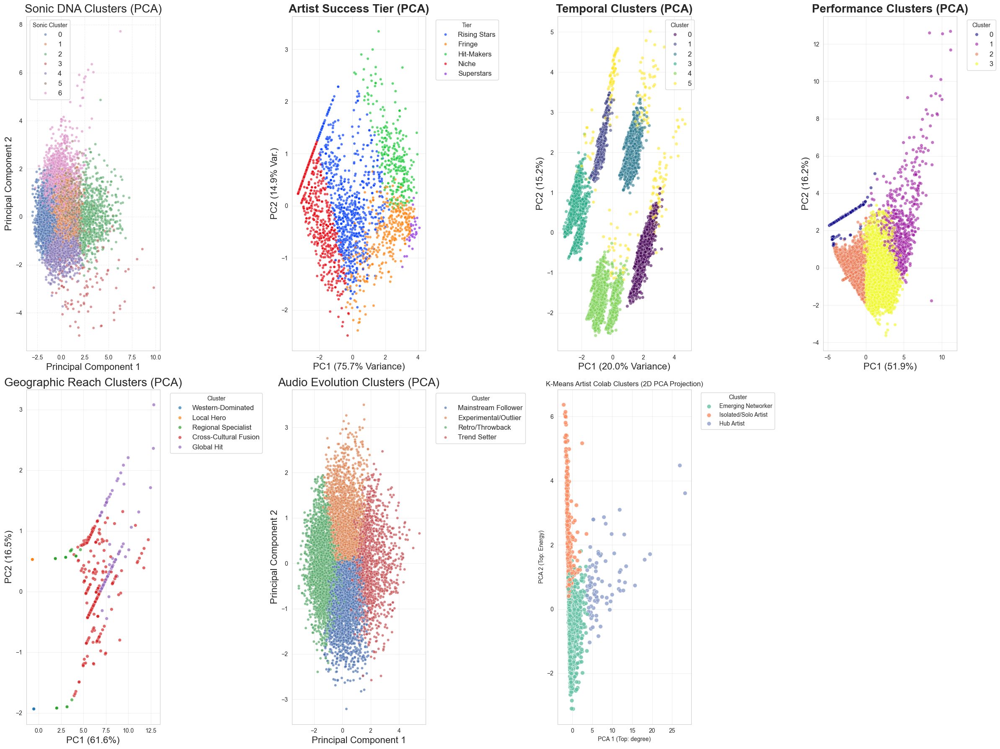

Saved combined figure to combined_pca_cluster_plots.svg


In [6]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PowerTransformer
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")


def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

# --- Subplot generator functions ---

def plot_pca_sonic_clusters(ax):
    try:
        AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
        df = pd.read_csv('song_master_table_with_clusters.csv')
        X = df[AUDIO_FEATURES].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
        sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette='deep', alpha=0.6, s=20)
        ax.set_title('Sonic DNA Clusters (PCA)', fontsize=20)
        ax.set_xlabel('Principal Component 1', fontsize=16)
        ax.set_ylabel('Principal Component 2', fontsize=16)
        ax.legend(fontsize=12, title='Sonic Cluster')
        ax.grid(True, linestyle='--', alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_pca_artist_tiers(ax):
    try:
        FILE_PATH = 'artist_master_table_with_clusters.csv'
        CLUSTER_COL = 'Artist_Tier'
        FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
        CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
        df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
        df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
        pt = PowerTransformer()
        X_scaled = pt.fit_transform(df[FEATURES])
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette='bright', s=20, alpha=0.7)
        var_expl = pca.explained_variance_ratio_
        ax.set_xlabel(f"PC1 ({var_expl[0]:.1%} Variance)", fontsize=16)
        ax.set_ylabel(f"PC2 ({var_expl[1]:.1%} Var.)", fontsize=16)
        ax.set_title('Artist Success Tier (PCA)', fontsize=20, fontweight='bold')
        ax.legend(title='Tier', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_pca_temporal_clusters(ax):
    try:
        FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
        df = pd.read_csv('temporal_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette='viridis', alpha=0.6, s=30)
        var_expl = pca.explained_variance_ratio_
        ax.set_xlabel(f"PC1 ({var_expl[0]:.1%} Variance)", fontsize=16)
        ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
        ax.set_title('Temporal Clusters (PCA)', fontsize=20, fontweight='bold')
        ax.legend(fontsize=12, title='Cluster', bbox_to_anchor=(1.05, 1))
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_pca_performance_clusters(ax):
    try:
        FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
        df = pd.read_csv('performance_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette='plasma', alpha=0.6, s=30)
        var_expl = pca.explained_variance_ratio_
        ax.set_xlabel(f"PC1 ({var_expl[0]:.1%})", fontsize=16)
        ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
        ax.set_title('Performance Clusters (PCA)', fontsize=20, fontweight='bold')
        ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), title='Cluster')
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_pca_geographic_clusters(ax):
    try:
        geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
        paths = [
            "songs_train_with_clusters.csv",
            os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
            os.path.join("..", "songs_train_with_clusters.csv")
        ]
        df = load_csv_first(paths)
        X = df[geo_features].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
        n_clusters = df[hue_col].nunique()
        palette = sns.color_palette("tab10", n_colors=n_clusters)
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=palette, s=30, alpha=0.7)
        var_expl = pca.explained_variance_ratio_
        ax.set_title("Geographic Reach Clusters (PCA)", fontsize=20)
        ax.set_xlabel(f"PC1 ({var_expl[0]:.1%})", fontsize=16)
        ax.set_ylabel(f"PC2 ({var_expl[1]:.1%})", fontsize=16)
        ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), title="Cluster")
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_audio_evolution_clusters(ax):
    try:
        possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
        df = load_csv_first(possible_paths)
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
        audio_features = ['Danceability', 'Energy', 'Valence']
        year_avg_features = df.groupby('Year')[audio_features].transform('mean')
        df_dev = df[audio_features].sub(year_avg_features)
        df_dev.columns = [f'{col}_dev' for col in audio_features]
        cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
        df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
        agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
        df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
        scaler = StandardScaler()
        X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df_unique['PCA 1'], df_unique['PCA 2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df_unique, x='PCA 1', y='PCA 2', hue=cluster_col, palette='deep', alpha=0.7, s=20)
        ax.set_title('Audio Evolution Clusters (PCA)', fontsize=20)
        ax.set_xlabel('Principal Component 1', fontsize=16)
        ax.set_ylabel('Principal Component 2', fontsize=16)
        ax.legend(title='Cluster', fontsize=12, bbox_to_anchor=(1.05, 1))
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

def plot_artist_feature_clusters(ax):
    try:
        artist_df = pd.read_csv('artist_features_with_clusters.csv')
        X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(X_train_scaled)
        artist_df['pca1'] = reduced[:, 0]
        artist_df['pca2'] = reduced[:, 1]

        feature_names = X_train_scaled.columns
        loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
        top_pca1 = loadings['PCA1'].abs().idxmax()
        top_pca2 = loadings['PCA2'].abs().idxmax()

        sns.scatterplot(
            ax=ax,
            data=artist_df,
            x='pca1', y='pca2',
            hue='cluster_label', palette='Set2', s=50, alpha=0.8
        )
        ax.set_title("K-Means Artist Colab Clusters (2D PCA Projection)")
        ax.set_xlabel(f"PCA 1 (Top: {top_pca1})")
        ax.set_ylabel(f"PCA 2 (Top: {top_pca2})")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cluster')
        ax.grid(True, alpha=0.3)
    except Exception as e:
        ax.set_title(f'Error: {e}', fontsize=14)
        ax.axis('off')

# --- Main Combined SVG plot ---
fig, axs = plt.subplots(2, 4, figsize=(24, 18))
plotters = [
    plot_pca_sonic_clusters,
    plot_pca_artist_tiers,
    plot_pca_temporal_clusters,
    plot_pca_performance_clusters,
    plot_pca_geographic_clusters,
    plot_audio_evolution_clusters,
    plot_artist_feature_clusters
]

for i, plotter in enumerate(plotters):
    row, col = divmod(i, 4)
    ax = axs[row, col]
    plotter(ax)

# Hide the last empty subplot if 7 plots (bottom-right)
if len(plotters) < axs.size:
    axs[1,3].axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots.svg", format="svg")
plt.show()
print("Saved combined figure to combined_pca_cluster_plots.svg")


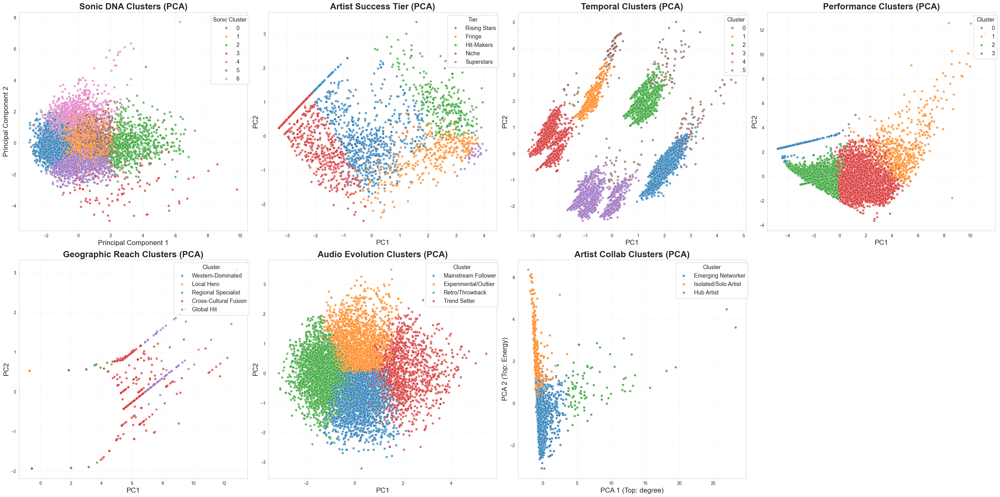

Saved combined figure to combined_pca_cluster_plots.svg


In [10]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PowerTransformer
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")

# Shared uniform settings
TITLE_KW = dict(fontsize=20, fontweight='bold')
XLABEL_KW = dict(fontsize=16)
YLABEL_KW = dict(fontsize=16)
LEGEND_KW = dict(fontsize=13, title_fontsize=13)
PALETTE = "tab10"
LEGEND_LOC = 'upper right'
LEGEND_BBOX = (1.02, 1)

def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

def paint(ax, title, xlabel, ylabel):
    ax.set_title(title, **TITLE_KW)
    ax.set_xlabel(xlabel, **XLABEL_KW)
    ax.set_ylabel(ylabel, **YLABEL_KW)
    ax.grid(True, linestyle='--', alpha=0.3)

def place_uniform_legend(ax, title):
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(title=title, bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC, **LEGEND_KW)
    else:
        ax.legend([], [], bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC)

def plot_pca_sonic_clusters(ax):
    try:
        AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
        df = pd.read_csv('song_master_table_with_clusters.csv')
        X = df[AUDIO_FEATURES].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
        sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic DNA Clusters (PCA)', 'Principal Component 1', 'Principal Component 2')
        place_uniform_legend(ax, 'Sonic Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_artist_tiers(ax):
    try:
        FILE_PATH = 'artist_master_table_with_clusters.csv'
        CLUSTER_COL = 'Artist_Tier'
        FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
        CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
        df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
        df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
        pt = PowerTransformer()
        X_scaled = pt.fit_transform(df[FEATURES])
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette=PALETTE, s=30, alpha=0.7)
        paint(ax, 'Artist Success Tier (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Tier')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_temporal_clusters(ax):
    try:
        FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
        df = pd.read_csv('temporal_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Temporal Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_performance_clusters(ax):
    try:
        FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
        df = pd.read_csv('performance_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Performance Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_geographic_clusters(ax):
    try:
        geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
        paths = [
            "songs_train_with_clusters.csv",
            os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
            os.path.join("..", "songs_train_with_clusters.csv")
        ]
        df = load_csv_first(paths)
        X = df[geo_features].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=PALETTE, s=30, alpha=0.7)
        paint(ax, "Geographic Reach Clusters (PCA)", 'PC1', 'PC2')
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_audio_evolution_clusters(ax):
    try:
        possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
        df = load_csv_first(possible_paths)
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
        audio_features = ['Danceability', 'Energy', 'Valence']
        year_avg_features = df.groupby('Year')[audio_features].transform('mean')
        df_dev = df[audio_features].sub(year_avg_features)
        df_dev.columns = [f'{col}_dev' for col in audio_features]
        cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
        df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
        agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
        df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
        scaler = StandardScaler()
        X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df_unique['PC1'], df_unique['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df_unique, x='PC1', y='PC2', hue=cluster_col, palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Audio Evolution Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_artist_feature_clusters(ax):
    try:
        artist_df = pd.read_csv('artist_features_with_clusters.csv')
        X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(X_train_scaled)
        artist_df['PC1'] = reduced[:, 0]
        artist_df['PC2'] = reduced[:, 1]
        feature_names = X_train_scaled.columns
        loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
        top_pca1 = loadings['PCA1'].abs().idxmax()
        top_pca2 = loadings['PCA2'].abs().idxmax()

        sns.scatterplot(
            ax=ax,
            data=artist_df,
            x='PC1', y='PC2',
            hue='cluster_label', palette=PALETTE, s=30, alpha=0.8
        )
        paint(ax, "Artist Collab Clusters (PCA)", f"PCA 1 (Top: {top_pca1})", f"PCA 2 (Top: {top_pca2})")
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

# --- Main Combined SVG plot ---
fig, axs = plt.subplots(2, 4, figsize=(32, 16)) # Wider than tall

plotters = [
    plot_pca_sonic_clusters,
    plot_pca_artist_tiers,
    plot_pca_temporal_clusters,
    plot_pca_performance_clusters,
    plot_pca_geographic_clusters,
    plot_audio_evolution_clusters,
    plot_artist_feature_clusters
]

for i, plotter in enumerate(plotters):
    row, col = divmod(i, 4)
    ax = axs[row, col]
    plotter(ax)

# Hide the last empty subplot if 7 plots (bottom-right)
if len(plotters) < axs.size:
    axs[1,3].axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots.svg", format="svg")
plt.show()
print("Saved combined figure to combined_pca_cluster_plots.svg")


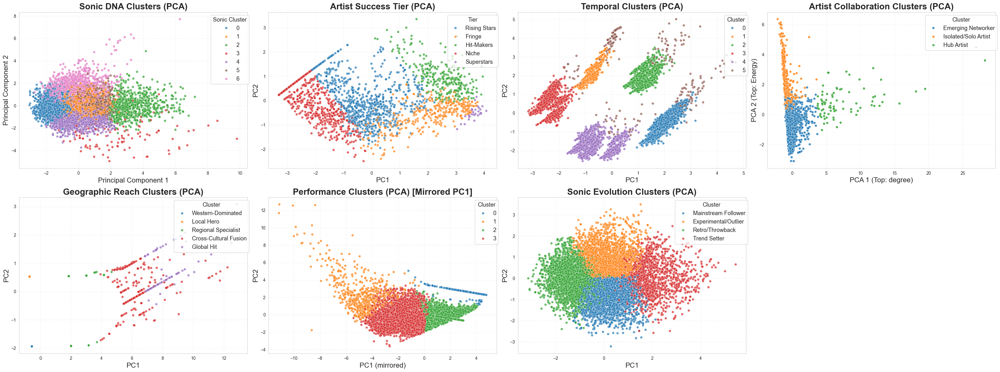

Saved combined figure to combined_pca_cluster_plots.svg


In [11]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PowerTransformer
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")

TITLE_KW = dict(fontsize=20, fontweight='bold')
XLABEL_KW = dict(fontsize=16)
YLABEL_KW = dict(fontsize=16)
LEGEND_KW = dict(fontsize=13, title_fontsize=13)
PALETTE = "tab10"
LEGEND_LOC = 'upper right'
LEGEND_BBOX = (1.02, 1)

def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

def paint(ax, title, xlabel, ylabel):
    ax.set_title(title, **TITLE_KW)
    ax.set_xlabel(xlabel, **XLABEL_KW)
    ax.set_ylabel(ylabel, **YLABEL_KW)
    ax.grid(True, linestyle='--', alpha=0.3)

def place_uniform_legend(ax, title):
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(title=title, bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC, **LEGEND_KW)
    else:
        ax.legend([], [], bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC)

def plot_pca_sonic_clusters(ax):
    try:
        AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
        df = pd.read_csv('song_master_table_with_clusters.csv')
        X = df[AUDIO_FEATURES].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
        sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic DNA Clusters (PCA)', 'Principal Component 1', 'Principal Component 2')
        place_uniform_legend(ax, 'Sonic Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_artist_tiers(ax):
    try:
        FILE_PATH = 'artist_master_table_with_clusters.csv'
        CLUSTER_COL = 'Artist_Tier'
        FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
        CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
        df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
        df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
        pt = PowerTransformer()
        X_scaled = pt.fit_transform(df[FEATURES])
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette=PALETTE, s=30, alpha=0.7)
        paint(ax, 'Artist Success Tier (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Tier')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_temporal_clusters(ax):
    try:
        FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
        df = pd.read_csv('temporal_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Temporal Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_artist_feature_clusters(ax):
    try:
        artist_df = pd.read_csv('artist_features_with_clusters.csv')
        X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(X_train_scaled)
        artist_df['PC1'] = reduced[:, 0]
        artist_df['PC2'] = reduced[:, 1]
        feature_names = X_train_scaled.columns
        loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
        top_pca1 = loadings['PCA1'].abs().idxmax()
        top_pca2 = loadings['PCA2'].abs().idxmax()

        sns.scatterplot(
            ax=ax,
            data=artist_df,
            x='PC1', y='PC2',
            hue='cluster_label', palette=PALETTE, s=30, alpha=0.8
        )
        paint(ax, "Artist Collaboration Clusters (PCA)", f"PCA 1 (Top: {top_pca1})", f"PCA 2 (Top: {top_pca2})")
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_geographic_clusters(ax):
    try:
        geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
        paths = [
            "songs_train_with_clusters.csv",
            os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
            os.path.join("..", "songs_train_with_clusters.csv")
        ]
        df = load_csv_first(paths)
        X = df[geo_features].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=PALETTE, s=30, alpha=0.7)
        paint(ax, "Geographic Reach Clusters (PCA)", 'PC1', 'PC2')
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_performance_clusters(ax):
    try:
        FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
        df = pd.read_csv('performance_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        # Mirror PC1
        df['PC1'] = -X_pca[:,0]   # Flipped PC1
        df['PC2'] = X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Performance Clusters (PCA) [Mirrored PC1]', 'PC1 (mirrored)', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_audio_evolution_clusters(ax):
    try:
        possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
        df = load_csv_first(possible_paths)
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
        audio_features = ['Danceability', 'Energy', 'Valence']
        year_avg_features = df.groupby('Year')[audio_features].transform('mean')
        df_dev = df[audio_features].sub(year_avg_features)
        df_dev.columns = [f'{col}_dev' for col in audio_features]
        cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
        df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
        agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
        df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
        scaler = StandardScaler()
        X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df_unique['PC1'], df_unique['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df_unique, x='PC1', y='PC2', hue=cluster_col, palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic Evolution Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

plotters_in_order = [
    plot_pca_sonic_clusters,       # 0
    plot_pca_artist_tiers,         # 1
    plot_pca_temporal_clusters,    # 2
    plot_artist_feature_clusters,  # 3
    plot_pca_geographic_clusters,  # 4
    plot_pca_performance_clusters, # 5 (mirrored PC1)
    plot_audio_evolution_clusters  # 6
]

fig, axs = plt.subplots(2, 4, figsize=(32, 12))

# Top row: left to right
for i in range(4):
    plotters_in_order[i](axs[0, i])

# Bottom row: place in left 3 positions, leave rightmost empty
for i in range(3):
    plotters_in_order[4 + i](axs[1, i])

axs[1, 3].axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots.svg", format="svg")
plt.show()
print("Saved combined figure to combined_pca_cluster_plots.svg")


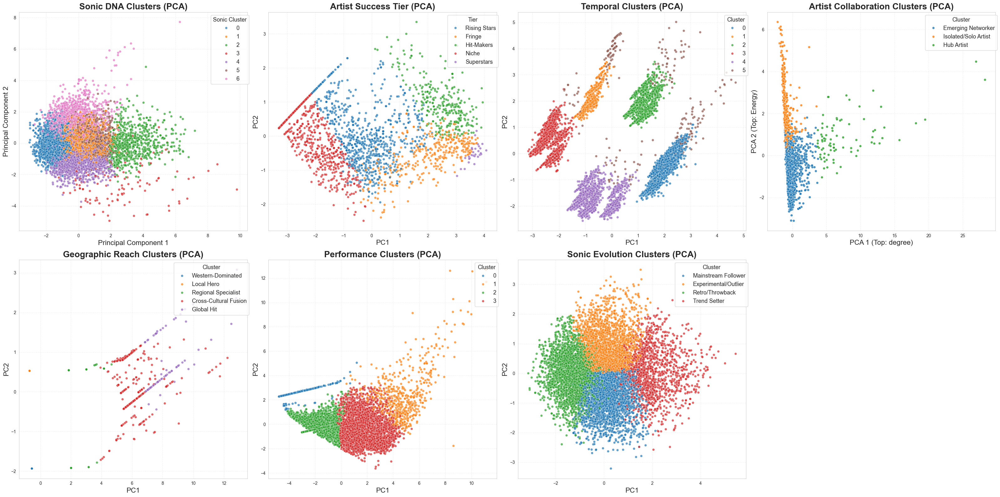

Saved combined figure to combined_pca_cluster_plots_final.svg


In [16]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PowerTransformer
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")

TITLE_KW = dict(fontsize=20, fontweight='bold')
XLABEL_KW = dict(fontsize=16)
YLABEL_KW = dict(fontsize=16)
LEGEND_KW = dict(fontsize=13, title_fontsize=13)
PALETTE = "tab10"
LEGEND_LOC = 'upper right'
LEGEND_BBOX = (1.02, 1)

def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

def paint(ax, title, xlabel, ylabel):
    ax.set_title(title, **TITLE_KW)
    ax.set_xlabel(xlabel, **XLABEL_KW)
    ax.set_ylabel(ylabel, **YLABEL_KW)
    ax.grid(True, linestyle='--', alpha=0.3)

def place_uniform_legend(ax, title):
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(title=title, bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC, **LEGEND_KW)
    else:
        ax.legend([], [], bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC)

def plot_pca_sonic_clusters(ax):
    try:
        AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
        df = pd.read_csv('song_master_table_with_clusters.csv')
        X = df[AUDIO_FEATURES].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
        sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic DNA Clusters (PCA)', 'Principal Component 1', 'Principal Component 2')
        place_uniform_legend(ax, 'Sonic Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_artist_tiers(ax):
    try:
        FILE_PATH = 'artist_master_table_with_clusters.csv'
        CLUSTER_COL = 'Artist_Tier'
        FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
        CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
        df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
        df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
        pt = PowerTransformer()
        X_scaled = pt.fit_transform(df[FEATURES])
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette=PALETTE, s=30, alpha=0.7)
        paint(ax, 'Artist Success Tier (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Tier')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_temporal_clusters(ax):
    try:
        FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
        df = pd.read_csv('temporal_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Temporal Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_artist_feature_clusters(ax):
    try:
        artist_df = pd.read_csv('artist_features_with_clusters.csv')
        X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(X_train_scaled)
        artist_df['PC1'] = reduced[:, 0]
        artist_df['PC2'] = reduced[:, 1]
        feature_names = X_train_scaled.columns
        loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
        top_pca1 = loadings['PCA1'].abs().idxmax()
        top_pca2 = loadings['PCA2'].abs().idxmax()

        sns.scatterplot(
            ax=ax,
            data=artist_df,
            x='PC1', y='PC2',
            hue='cluster_label', palette=PALETTE, s=30, alpha=0.8
        )
        paint(ax, "Artist Collaboration Clusters (PCA)", f"PCA 1 (Top: {top_pca1})", f"PCA 2 (Top: {top_pca2})")
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_geographic_clusters(ax):
    try:
        geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
        paths = [
            "songs_train_with_clusters.csv",
            os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
            os.path.join("..", "songs_train_with_clusters.csv")
        ]
        df = load_csv_first(paths)
        X = df[geo_features].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=PALETTE, s=30, alpha=0.7)
        paint(ax, "Geographic Reach Clusters (PCA)", 'PC1', 'PC2')
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_performance_clusters(ax):
    try:
        FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
        df = pd.read_csv('performance_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Performance Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_audio_evolution_clusters(ax):
    try:
        possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
        df = load_csv_first(possible_paths)
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
        audio_features = ['Danceability', 'Energy', 'Valence']
        year_avg_features = df.groupby('Year')[audio_features].transform('mean')
        df_dev = df[audio_features].sub(year_avg_features)
        df_dev.columns = [f'{col}_dev' for col in audio_features]
        cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
        df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
        agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
        df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
        scaler = StandardScaler()
        X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df_unique['PC1'], df_unique['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df_unique, x='PC1', y='PC2', hue=cluster_col, palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic Evolution Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

# List of plot functions in requested order
plotters_in_order = [
    plot_pca_sonic_clusters,
    plot_pca_artist_tiers,
    plot_pca_temporal_clusters,
    plot_artist_feature_clusters,
    plot_pca_geographic_clusters,
    plot_pca_performance_clusters,
    plot_audio_evolution_clusters
]

# Figure (wider than tall), 4-3 grid
fig, axs = plt.subplots(2, 4, figsize=(32, 16))

# Top row: left to right
for i in range(4):
    plotters_in_order[i](axs[0, i])

# Bottom row: place in left 3 positions, leave rightmost empty
for i in range(3):
    plotters_in_order[4 + i](axs[1, i])

axs[1, 3].axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots_final.svg", format="svg")
fig.savefig("combined_pca_cluster_plots_final.png", dpi=200, bbox_inches='tight')

plt.show()
print("Saved combined figure to combined_pca_cluster_plots_final.svg")

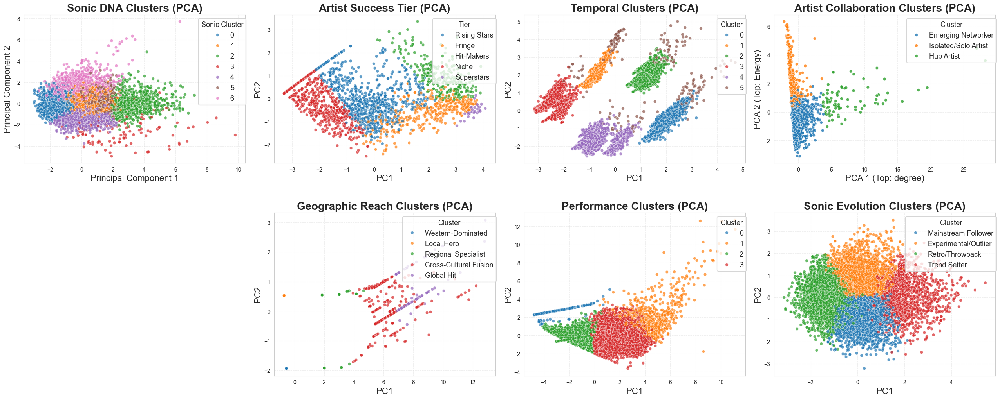

Saved combined figure to combined_pca_cluster_plots.svg


In [9]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PowerTransformer
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")

TITLE_KW = dict(fontsize=20, fontweight='bold')
XLABEL_KW = dict(fontsize=16)
YLABEL_KW = dict(fontsize=16)
LEGEND_KW = dict(fontsize=13, title_fontsize=13)
PALETTE = "tab10"
LEGEND_LOC = 'upper right'
LEGEND_BBOX = (1.02, 1)

def load_csv_first(pathlist):
    for path in pathlist:
        if os.path.exists(path):
            return pd.read_csv(path)
    raise FileNotFoundError(f"None of the files found in: {pathlist}")

def paint(ax, title, xlabel, ylabel):
    ax.set_title(title, **TITLE_KW)
    ax.set_xlabel(xlabel, **XLABEL_KW)
    ax.set_ylabel(ylabel, **YLABEL_KW)
    ax.grid(True, linestyle='--', alpha=0.3)

def place_uniform_legend(ax, title):
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(title=title, bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC, **LEGEND_KW)
    else:
        ax.legend([], [], bbox_to_anchor=LEGEND_BBOX, loc=LEGEND_LOC)

def plot_pca_sonic_clusters(ax):
    try:
        AUDIO_FEATURES = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']
        df = pd.read_csv('song_master_table_with_clusters.csv')
        X = df[AUDIO_FEATURES].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        pca_df['Sonic_Cluster'] = df['Sonic_Cluster'].astype('category')
        sns.scatterplot(ax=ax, data=pca_df, x='PC1', y='PC2', hue='Sonic_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic DNA Clusters (PCA)', 'Principal Component 1', 'Principal Component 2')
        place_uniform_legend(ax, 'Sonic Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_artist_tiers(ax):
    try:
        FILE_PATH = 'artist_master_table_with_clusters.csv'
        CLUSTER_COL = 'Artist_Tier'
        FEATURES = ['total_chart_appearances', 'average_rank', 'best_rank', 'career_length_days', 'top_50_rate']
        CLUSTER_NAMES = {0:"Rising Stars", 1:"Hit-Makers", 2:"Fringe", 3:"Superstars", 4:"Niche"}
        df = pd.read_csv(FILE_PATH).dropna(subset=FEATURES + [CLUSTER_COL])
        df['Cluster_Name'] = df[CLUSTER_COL].map(CLUSTER_NAMES).fillna(df[CLUSTER_COL])
        pt = PowerTransformer()
        X_scaled = pt.fit_transform(df[FEATURES])
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Cluster_Name', palette=PALETTE, s=30, alpha=0.7)
        paint(ax, 'Artist Success Tier (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Tier')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_temporal_clusters(ax):
    try:
        FEATURES = ['Year','Month_Sin','Month_Cos','DayOfWeek_Sin','DayOfWeek_Cos','IsWeekend','Quarter','Chart_Weeks','Days_In_Charts','Weeks_Per_Day_Ratio','Quick_Peak_Score','Season_Fall','Season_Spring','Season_Summer','Season_Winter']
        df = pd.read_csv('temporal_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Temporal_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Temporal Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_artist_feature_clusters(ax):
    try:
        artist_df = pd.read_csv('artist_features_with_clusters.csv')
        X_train_scaled = pd.read_csv('X_trained_artist.csv', index_col=0)
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(X_train_scaled)
        artist_df['PC1'] = reduced[:, 0]
        artist_df['PC2'] = reduced[:, 1]
        feature_names = X_train_scaled.columns
        loadings = pd.DataFrame(pca.components_.T, columns=['PCA1', 'PCA2'], index=feature_names)
        top_pca1 = loadings['PCA1'].abs().idxmax()
        top_pca2 = loadings['PCA2'].abs().idxmax()

        sns.scatterplot(
            ax=ax,
            data=artist_df,
            x='PC1', y='PC2',
            hue='cluster_label', palette=PALETTE, s=30, alpha=0.8
        )
        paint(ax, "Artist Collaboration Clusters (PCA)", f"PCA 1 (Top: {top_pca1})", f"PCA 2 (Top: {top_pca2})")
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_geographic_clusters(ax):
    try:
        geo_features = ['num_nationalities','num_continents','international_collab','geographic_diversity_score','points_from_international','western_dominance']
        paths = [
            "songs_train_with_clusters.csv",
            os.path.join("geo_clustering_outputs", "songs_train_with_clusters.csv"),
            os.path.join("..", "songs_train_with_clusters.csv")
        ]
        df = load_csv_first(paths)
        X = df[geo_features].fillna(0)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        hue_col = 'cluster_label' if 'cluster_label' in df.columns else 'cluster'
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue=hue_col, palette=PALETTE, s=30, alpha=0.7)
        paint(ax, "Geographic Reach Clusters (PCA)", 'PC1', 'PC2')
        place_uniform_legend(ax, "Cluster")
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_pca_performance_clusters(ax):
    try:
        FEATURES = ['Best_Rank','Avg_Rank','Rank_Std','Chart_Weeks','Total_Points','Points_Per_Week','Top10_Rate','Top50_Rate','Rank_Range','Volatility_Score','Dominance_Score','Consistency_Score','Rank_Trajectory']
        df = pd.read_csv('performance_features_with_clusters.csv')
        X = df[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(df[FEATURES].median())
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df['PC1'], df['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df, x='PC1', y='PC2', hue='Performance_Cluster', palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Performance Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

def plot_audio_evolution_clusters(ax):
    try:
        possible_paths = ["Audio_evolution_clustering.csv", os.path.join("..", "Audio_evolution_clustering.csv"), os.path.join("data", "Audio_evolution_clustering.csv")]
        df = load_csv_first(possible_paths)
        df['Date'] = pd.to_datetime(df['Date'])
        df['Year'] = df['Date'].dt.year
        audio_features = ['Danceability', 'Energy', 'Valence']
        year_avg_features = df.groupby('Year')[audio_features].transform('mean')
        df_dev = df[audio_features].sub(year_avg_features)
        df_dev.columns = [f'{col}_dev' for col in audio_features]
        cluster_col = 'evolution_cluster_name' if 'evolution_cluster_name' in df.columns else 'cluster'
        df_temp = pd.concat([df[['id', cluster_col]], df_dev], axis=1)
        agg_dict = {col:'mean' for col in df_dev.columns}; agg_dict[cluster_col]='first'
        df_unique = df_temp.groupby('id').agg(agg_dict).reset_index()
        scaler = StandardScaler()
        X = df_unique[[c for c in df_unique.columns if '_dev' in c]]
        X_scaled = scaler.fit_transform(X)
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        df_unique['PC1'], df_unique['PC2'] = X_pca[:,0], X_pca[:,1]
        sns.scatterplot(ax=ax, data=df_unique, x='PC1', y='PC2', hue=cluster_col, palette=PALETTE, alpha=0.7, s=30)
        paint(ax, 'Sonic Evolution Clusters (PCA)', 'PC1', 'PC2')
        place_uniform_legend(ax, 'Cluster')
    except Exception as e:
        ax.set_title(f'Error: {e}', **TITLE_KW)
        ax.axis('off')

plotters_in_order = [
    plot_pca_sonic_clusters,       # 0
    plot_pca_artist_tiers,         # 1
    plot_pca_temporal_clusters,    # 2
    plot_artist_feature_clusters,  # 3
    plot_pca_geographic_clusters,  # 4
    plot_pca_performance_clusters, # 5
    plot_audio_evolution_clusters  # 6
]

fig = plt.figure(figsize=(32, 12))
gs = GridSpec(2, 4, height_ratios=[1, 1.1], hspace=0.32, wspace=0.13)

# First row: 4 plots left to right
axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i])
    plotters_in_order[i](ax)
    axes.append(ax)

# Bottom: center 3 plots spanning columns 0–1, 1–2, 2–3
# This makes the bottom row "visually centered"
bottom_positions = [(1, 0), (1, 1), (1, 2)]
for idx, (r, c) in enumerate(bottom_positions):
    ax = fig.add_subplot(gs[r, c+1])  # so use columns 1,2,3
    plotters_in_order[4 + idx](ax)
    axes.append(ax)

# Hide unused subplot (bottom left)
ax_empty = fig.add_subplot(gs[1, 0])
ax_empty.axis('off')

fig.tight_layout(rect=[0,0,1,1])
fig.savefig("combined_pca_cluster_plots.svg", format="svg")
plt.show()
print("Saved combined figure to combined_pca_cluster_plots.svg")
